# Canopy Height Mapping: Fold-wise MLP with GroupKFold(10)

<a target="_blank" href="https://colab.research.google.com/github/yiddawela/OpenGeoHub_2025/blob/main/solution_mlp_foldwise.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>


This notebook mirrors a per-fold tuning and prediction workflow:
- Use GroupKFold(n_splits=10) with provided spatial groups (or auto-clustered if missing)
- For each fold: tune an MLP (scikit-learn) on that fold’s train/val split, fit final model, predict test
- Average the test predictions across the 10 fold-specific models
- Report out-of-fold (OOF) RMSE for validation


In [ ]:
# Installs (run once if needed)
# %pip install -q numpy pandas scikit-learn seaborn matplotlib optuna

import os, re, json, math, time
import numpy as np
import pandas as pd
from pathlib import Path

import matplotlib.pyplot as plt
import seaborn as sns

import optuna
from sklearn.model_selection import GroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.neural_network import MLPRegressor
from sklearn.cluster import KMeans

sns.set(context='notebook', style='whitegrid', palette='deep')

RANDOM_STATE = 42
N_SPLITS = 10
N_JOBS = -1

BASE_DIR = Path('/Users/yohan/Documents/GitHub/OpenGeoHub_2025')
TRAIN_PATH = BASE_DIR / 'train.csv'
TEST_PATH  = BASE_DIR / 'test.csv'

print({'N_SPLITS': N_SPLITS})


Note: you may need to restart the kernel to use updated packages.
{'N_SPLITS': 10}


In [3]:
def read_csv_fast(path, nrows=None):
    return pd.read_csv(path, nrows=nrows)

train = read_csv_fast(TRAIN_PATH)
test  = read_csv_fast(TEST_PATH)
print('Train:', train.shape, 'Test:', test.shape)

TARGET_COL = 'rh98'

# Identify embedding columns
pat = re.compile(r'^cv_(\d+)_google\.embedding_nl$')
embed_cols = [c for c in train.columns if pat.match(c)]
if len(embed_cols) == 0:
    embed_cols = [c for c in train.columns if 'embedding' in c.lower()]

feature_cols = embed_cols  # embeddings only for this notebook

X = train[feature_cols].copy()
y = train[TARGET_COL].astype(float).values
X_test = test[feature_cols].copy()

# Get or build groups
if 'spatial_cluster' in train.columns:
    groups = train['spatial_cluster'].values
else:
    # Auto-cluster lon/lat if present; else fallback to KMeans on embeddings
    lon_col = next((c for c in train.columns if c.lower() in ['lon','longitude','lng','x']), None)
    lat_col = next((c for c in train.columns if c.lower() in ['lat','latitude','y']), None)
    if lon_col and lat_col:
        base = train[[lon_col, lat_col]].values
    else:
        base = X.values
    km = KMeans(n_clusters=25, random_state=RANDOM_STATE, n_init='auto')
    groups = km.fit_predict(base)
    train['spatial_cluster'] = groups

print('Features:', len(feature_cols), 'Groups present:', True)



Train: (39535, 67) Test: (19745, 65)
Features: 64 Groups present: True


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: divide by zero encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/opt/homebrew/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: overflow encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/opt/homebrew/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: invalid value encountered in matmul
  current_pot = closest_dist_sq @ sample_weight


In [4]:
def rmse_cm(y_true, y_pred):
    return math.sqrt(mean_squared_error(y_true, y_pred))

# Optuna objective for a single fold
def objective(trial, X_train, y_train, X_val, y_val):
    params = {
        'hidden_layer_sizes': trial.suggest_categorical('hidden_layer_sizes', [(128,), (256,), (256,128), (512,256)]),
        'alpha': trial.suggest_float('alpha', 1e-6, 1e-2, log=True),
        'learning_rate_init': trial.suggest_categorical('learning_rate_init', [1e-4, 3e-4, 1e-3, 3e-3]),
        'batch_size': trial.suggest_categorical('batch_size', [128, 256, 512]),
    }
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('model', MLPRegressor(
            hidden_layer_sizes=params['hidden_layer_sizes'],
            alpha=params['alpha'],
            learning_rate_init=params['learning_rate_init'],
            batch_size=params['batch_size'],
            activation='relu', solver='adam',
            early_stopping=True, max_iter=500,
            random_state=RANDOM_STATE
        ))
    ])
    pipe.fit(X_train, y_train)
    preds = pipe.predict(X_val)
    return rmse_cm(y_val, preds)

# Fold-wise tuning and prediction
predicted_test = []
oof = np.zeros(len(y))

gkf = GroupKFold(n_splits=N_SPLITS)
for fold, (tr_idx, va_idx) in enumerate(gkf.split(X, y, groups=groups), 1):
    X_tr, X_va = X.iloc[tr_idx], X.iloc[va_idx]
    y_tr, y_va = y[tr_idx], y[va_idx]

    study = optuna.create_study(direction='minimize', sampler=optuna.samplers.TPESampler(seed=RANDOM_STATE))
    study.optimize(lambda t: objective(t, X_tr, y_tr, X_va, y_va), n_trials=20, n_jobs=1)

    best_params = study.best_params
    best_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('model', MLPRegressor(
            hidden_layer_sizes=best_params['hidden_layer_sizes'],
            alpha=best_params['alpha'],
            learning_rate_init=best_params['learning_rate_init'],
            batch_size=best_params['batch_size'],
            activation='relu', solver='adam',
            early_stopping=True, max_iter=500,
            random_state=RANDOM_STATE
        ))
    ])

    best_pipe.fit(X_tr, y_tr)
    oof[va_idx] = best_pipe.predict(X_va)

    y_pred_test = best_pipe.predict(X_test)
    predicted_test.append(y_pred_test)
    print(f"Fold {fold} done. Best params: {best_params}")

# OOF RMSE
oof_rmse = rmse_cm(y, oof)
print('OOF RMSE (cm):', round(oof_rmse, 2))

# Average test predictions across folds
final_pred = np.mean(np.vstack(predicted_test), axis=0)
print('Final test predictions shape:', final_pred.shape)


[I 2025-09-02 19:01:06,989] A new study created in memory with name: no-name-0607bf1b-6c31-40b4-9297-e4bea2c34580
/opt/homebrew/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (128,) which is of type tuple.
  warnings.warn(message)
/opt/homebrew/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (256,) which is of type tuple.
  warnings.warn(message)
/opt/homebrew/lib/python3.11/site-packages/optuna/distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (256, 128) which is of type tuple.
  warnings.warn(message)
/opt/homebrew/lib/python3.11/site-packages/optuna/distributions.py:518: UserWa

Fold 1 done. Best params: {'hidden_layer_sizes': (512, 256), 'alpha': 0.009790658543686008, 'learning_rate_init': 0.0003, 'batch_size': 512}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 2 done. Best params: {'hidden_layer_sizes': (256, 128), 'alpha': 4.2239176219265695e-05, 'learning_rate_init': 0.001, 'batch_size': 128}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 3 done. Best params: {'hidden_layer_sizes': (512, 256), 'alpha': 0.0005729891581071097, 'learning_rate_init': 0.0001, 'batch_size': 256}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 4 done. Best params: {'hidden_layer_sizes': (256,), 'alpha': 5.522206236542031e-05, 'learning_rate_init': 0.003, 'batch_size': 128}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 5 done. Best params: {'hidden_layer_sizes': (256, 128), 'alpha': 0.003538758864779244, 'learning_rate_init': 0.003, 'batch_size': 256}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 6 done. Best params: {'hidden_layer_sizes': (256,), 'alpha': 0.001353094173734863, 'learning_rate_init': 0.003, 'batch_size': 128}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 7 done. Best params: {'hidden_layer_sizes': (256,), 'alpha': 0.001827547541328107, 'learning_rate_init': 0.003, 'batch_size': 128}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 8 done. Best params: {'hidden_layer_sizes': (256,), 'alpha': 2.586200045616469e-05, 'learning_rate_init': 0.003, 'batch_size': 128}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 9 done. Best params: {'hidden_layer_sizes': (256, 128), 'alpha': 0.0008987153901963637, 'learning_rate_init': 0.001, 'batch_size': 256}


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-

Fold 10 done. Best params: {'hidden_layer_sizes': (512, 256), 'alpha': 0.0003191717765142266, 'learning_rate_init': 0.0003, 'batch_size': 128}
OOF RMSE (cm): 537.99
Final test predictions shape: (19745,)


/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/opt/homebrew/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


Best trial #19 RMSE: 625.4656


hidden_layer_sizes    (512, 256)
alpha                   0.000319
learning_rate_init        0.0003
batch_size                   128
Name: value, dtype: object

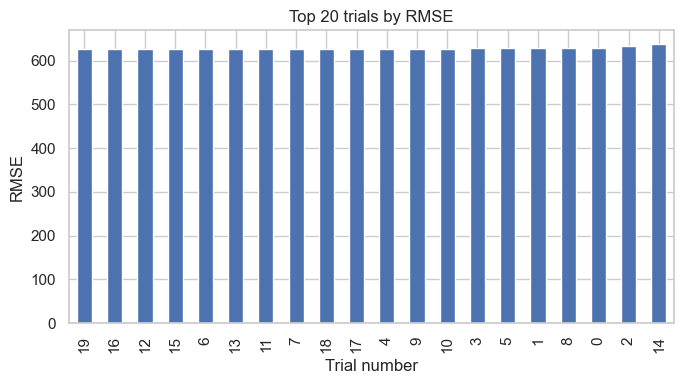

In [7]:
# --- Visualise RMSE for the best trial + top trials (fixed 'state' issue) ---

import math
import pandas as pd
import matplotlib.pyplot as plt
import optuna

def _to_rmse(value, metric_name=None):
    if metric_name is None:
        return float(value)
    m = str(metric_name).lower()
    if m in {"rmse", "root_mean_squared_error"}:
        return float(value)
    if m in {"mse", "mean_squared_error"}:
        return math.sqrt(float(value))
    return float(value)

def _show_best_from_study(study):
    best = study.best_trial
    metric_name = best.user_attrs.get("metric_name", "rmse")
    best_rmse = _to_rmse(best.value, metric_name)
    print(f"Best trial #{best.number} RMSE: {best_rmse:.4f}")
    # Show params in a tidy view
    try:
        display(pd.Series(best.params, name="value"))
    except NameError:
        print(best.params)

    # Per-fold RMSE if stored
    for k in ["fold_rmse", "rmse_per_fold", "fold_scores", "cv_rmse"]:
        if k in best.user_attrs and isinstance(best.user_attrs[k], (list, tuple)):
            fold_vals = [float(v) for v in best.user_attrs[k]]
            df_folds = pd.DataFrame({"fold": range(1, len(fold_vals)+1), "rmse": fold_vals})
            ax = df_folds.sort_values("rmse").plot.bar(x="fold", y="rmse", legend=False, figsize=(6,4))
            ax.set_title("Per-fold RMSE for best trial")
            ax.set_xlabel("Fold")
            ax.set_ylabel("RMSE")
            plt.tight_layout()
            plt.show()
            return True
    return False

def _plot_top_trials_from_trials_obj(study, top_n=20):
    # Build a dataframe from Trial objects to avoid the 'state' column issue
    rows = []
    metric_name = study.best_trial.user_attrs.get("metric_name", "rmse")
    for t in study.trials:
        # Only completed trials
        if t.state == optuna.trial.TrialState.COMPLETE and t.value is not None:
            rows.append(
                {
                    "number": t.number,
                    "rmse": _to_rmse(t.value, metric_name),
                }
            )
    if not rows:
        print("No completed trials found to plot.")
        return

    df = pd.DataFrame(rows).sort_values("rmse", ascending=True).head(top_n)
    ax = df.plot.bar(x="number", y="rmse", legend=False, figsize=(7,4))
    ax.set_title(f"Top {min(top_n, len(df))} trials by RMSE")
    ax.set_xlabel("Trial number")
    ax.set_ylabel("RMSE")
    plt.tight_layout()
    plt.show()

did_plot = False

if "study" in globals():
    try:
        did_plot = _show_best_from_study(study)
        if not did_plot:
            _plot_top_trials_from_trials_obj(study, top_n=20)
            did_plot = True
    except Exception as e:
        print(f"Could not inspect in-memory study: {e}")

# Fallback: OOF RMSE if available
if not did_plot and "oof_preds" in globals() and "y" in globals():
    from sklearn.metrics import mean_squared_error
    rmse = mean_squared_error(y, oof_preds, squared=False)
    print(f"Overall OOF RMSE: {rmse:.4f}")

In [5]:
# Save predictions and a brief note
out = pd.DataFrame({'pred_cm': final_pred})
out['pred_m'] = out['pred_cm'] / 100.0

PRED_PATH = BASE_DIR / 'test_predictions_mlp_foldwise.csv'
out.to_csv(PRED_PATH, index=False)

note = {
    'cv': {'type': 'GroupKFold', 'n_splits': N_SPLITS},
    'oof_rmse_cm': float(oof_rmse),
    'embeddings_used': len(feature_cols)
}
with open(BASE_DIR / 'mlp_foldwise_note.json', 'w') as f:
    json.dump(note, f, indent=2)

print('Saved:', PRED_PATH)


Saved: /Users/yohan/Documents/GitHub/OpenGeoHub_2025/test_predictions_mlp_foldwise.csv
